# Анализ данных

In [8]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import KNNImputer
from pandas_profiling import ProfileReport

In [9]:
np_df = pd.read_excel('final_data.xlsx')
np_df = np_df.drop(columns = ['Unnamed: 0'], axis = 1)

In [10]:
np_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9143 entries, 0 to 9142
Data columns (total 16 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   nanoparticle         9143 non-null   object 
 1   size_nm              9020 non-null   float64
 2   surface_charge_mV    6373 non-null   float64
 3   cell_type            9143 non-null   int64  
 4   concentration_ug/mL  8921 non-null   float64
 5   viability_%          9143 non-null   float64
 6   organic              9143 non-null   int64  
 7   time_h               9143 non-null   int64  
 8   animal               9143 non-null   int64  
 9   coating              9143 non-null   int64  
 10  test                 9143 non-null   int64  
 11  cell_line            9143 non-null   int64  
 12  cell_morphology      9143 non-null   int64  
 13  molar_mass           9143 non-null   float64
 14  electronegativity    7437 non-null   float64
 15  charge_density       7437 non-null   f

## Одномерный анализ
Сначала посмотрим на все характеристики в общем с помощью библиотеки pandas_profiling

In [11]:
profile = ProfileReport(np_df)
profile

Render HTML: 100%|██████████| 1/1 [00:04<00:00,  4.90s/it]


## Круговые диаграммы, для признаков, имеющих малое количество значений
1. organic
2. animal
3. cell_type
4. cell_line

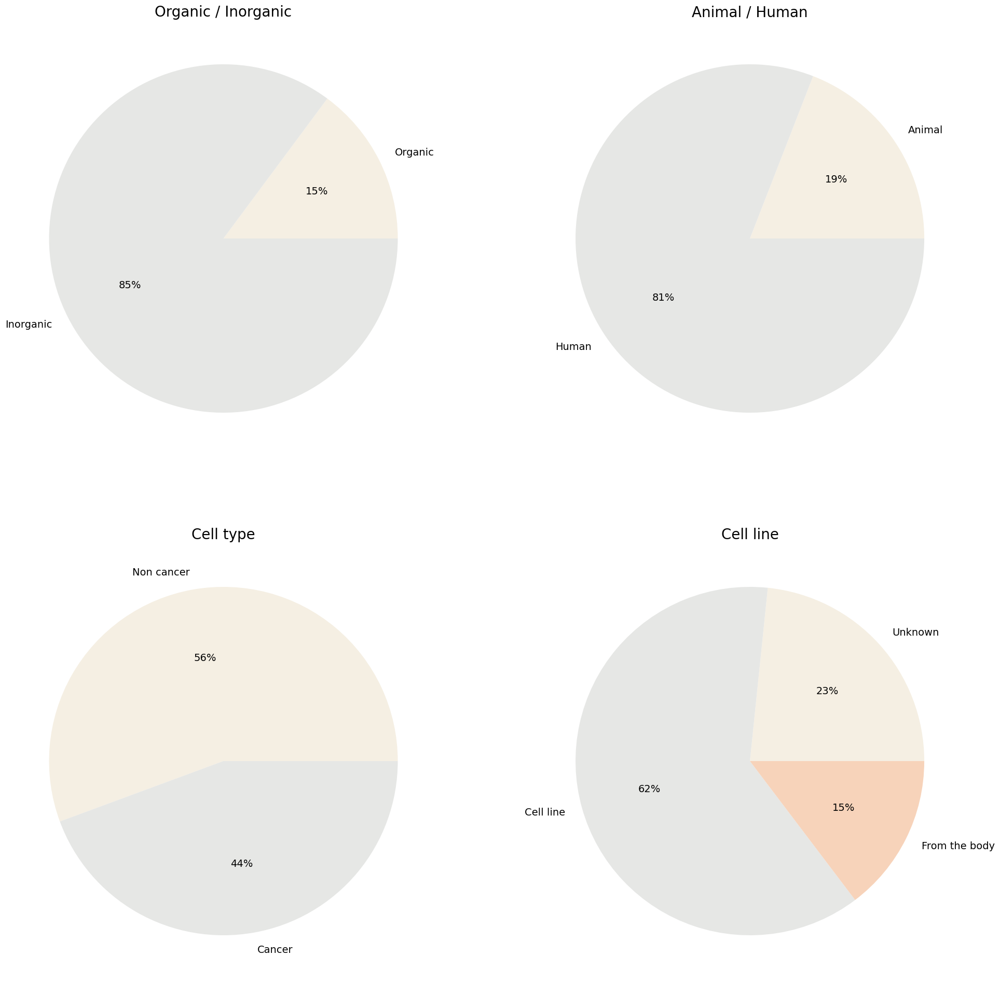

<Figure size 640x480 with 0 Axes>

In [12]:
colors = ['#F5EFE3', '#E6E7E5', '#F7D3BA', '#A6AA9C'] #Палетка цветов
fig, axs = plt.subplots(nrows = 2, ncols = 2, figsize = (24, 24))
table = np_df.groupby('organic').count()
axs[0][0].pie(table['nanoparticle'], labels = ['Organic', 'Inorganic'], colors = colors, autopct = '%1.0f%%', textprops={'fontsize': 14})
axs[0][0].set_title('Organic / Inorganic', fontsize = 20)

table = np_df.groupby('animal').count()
axs[0][1].pie(table['nanoparticle'], labels = ['Animal', 'Human'], colors = colors, autopct = '%1.0f%%', textprops={'fontsize': 14})
axs[0][1].set_title('Animal / Human', fontsize = 20)

table = np_df.groupby('cell_type').count()
axs[1][0].pie(table['nanoparticle'], labels = ['Non cancer', 'Cancer'], colors = colors, autopct = '%1.0f%%', textprops={'fontsize': 14})
axs[1][0].set_title('Cell type', fontsize = 20)

table = np_df.groupby('cell_line').count()
axs[1][1].pie(table['nanoparticle'], labels = ['Unknown', 'Cell line', 'From the body'], colors = colors, autopct = '%1.0f%%', textprops={'fontsize': 14})
axs[1][1].set_title('Cell line', fontsize = 20)

plt.show()
plt.savefig('piecharts.png', transparent = True)

Рассмотрим признаки, которые имеют два значения

1. Большинство соединений в датафрейме неорганические
2. Нормальных клеток (не раковых) немного больше
3. Большинство испытаний проводилось на клетках человека
4. Клеточные линии - больше клеток из первой группы

## Гистограммы и боксплоты распределения численных переменных / Столбчатые диаграммы для категориальных

### Nanoparticle

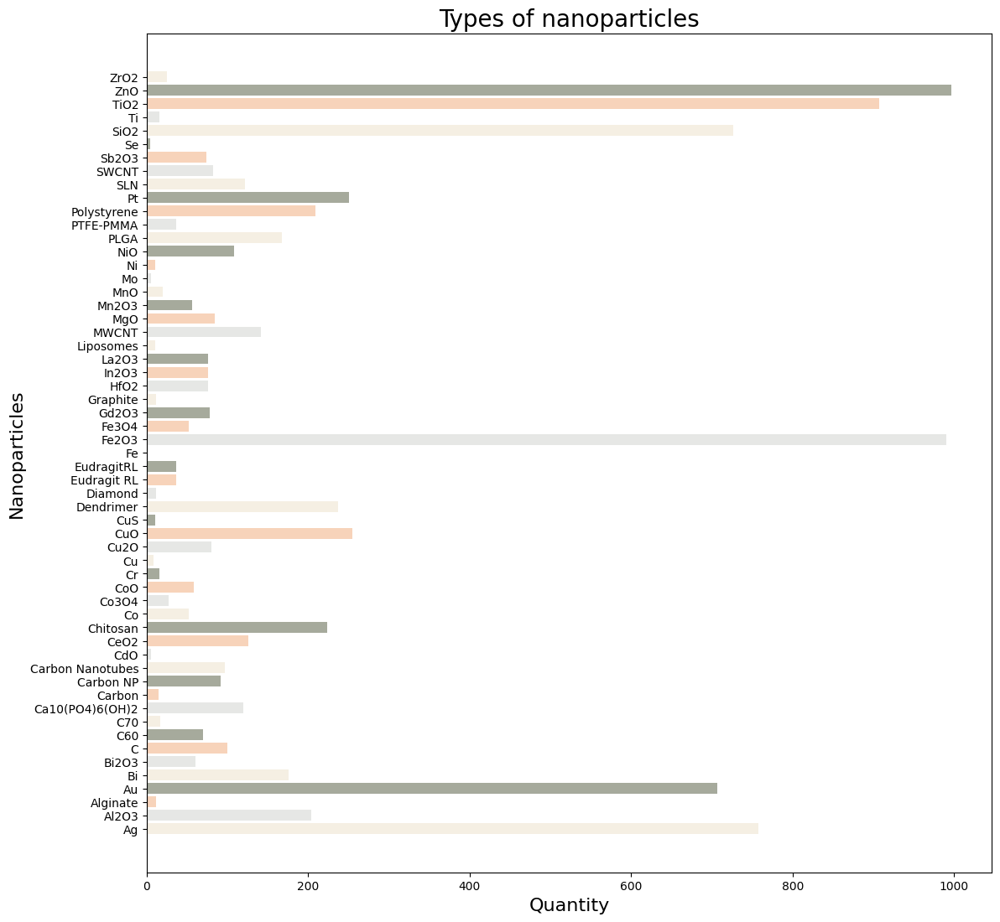

In [13]:
fig, ax = plt.subplots(figsize = (13, 13))
table = np_df.groupby('nanoparticle').agg({'size_nm':'count'})
plt.barh(table.index, table['size_nm'], color = colors)
ax.set_title('Types of nanoparticles', fontsize=20)
ax.set_xlabel('Quantity', fontsize=16)
ax.set_ylabel('Nanoparticles', fontsize=16)
plt.show()


### Size_nm

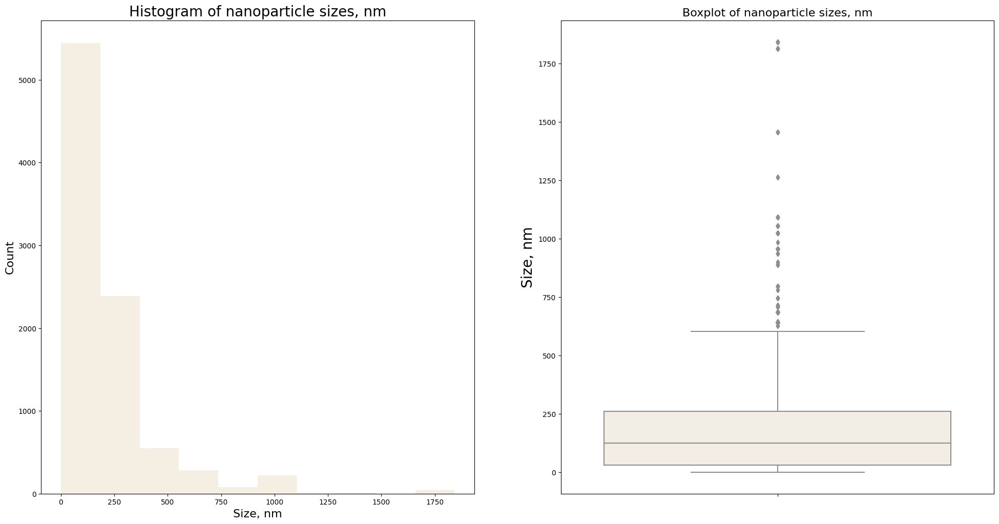

In [14]:
fig_size, ax_size = plt.subplots(nrows = 1, ncols = 2, figsize = (24, 12))
ax_size[0].hist(np_df['size_nm'], color = '#F5EFE3')
ax_size[0].set_title('Histogram of nanoparticle sizes, nm', fontsize=20)
ax_size[0].set_xlabel('Size, nm', fontsize=16)
ax_size[0].set_ylabel('Count', fontsize=16)

ax_size[1]= sns.boxplot(y = np_df['size_nm'], palette = colors)
ax_size[1].set_title('Boxplot of nanoparticle sizes, nm', fontsize=16)
ax_size[1].set_ylabel('Size, nm', fontsize=20)
plt.show()


### Surface_charge_mV

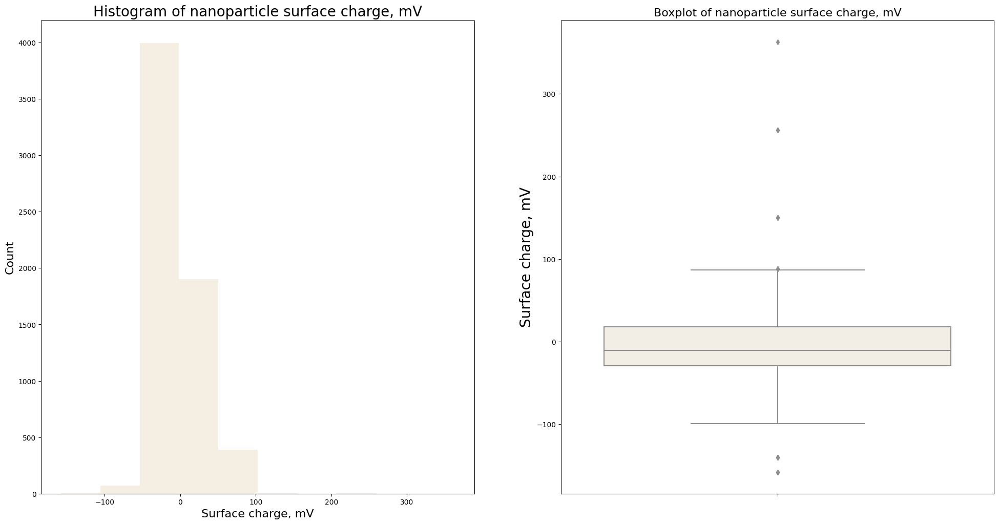

In [15]:
fig_Surf, ax_Surf = plt.subplots(nrows = 1, ncols = 2, figsize = (24, 12))
ax_Surf[0].hist(np_df['surface_charge_mV'], color = '#F5EFE3')
ax_Surf[0].set_title('Histogram of nanoparticle surface charge, mV', fontsize=20)
ax_Surf[0].set_xlabel('Surface charge, mV', fontsize=16)
ax_Surf[0].set_ylabel('Count', fontsize=16)

ax_Surf[1]= sns.boxplot(y = np_df['surface_charge_mV'], palette = colors)
ax_Surf[1].set_title('Boxplot of nanoparticle surface charge, mV', fontsize=16)
ax_Surf[1].set_ylabel('Surface charge, mV', fontsize=20)

plt.show()

### Concentration_ug/mL

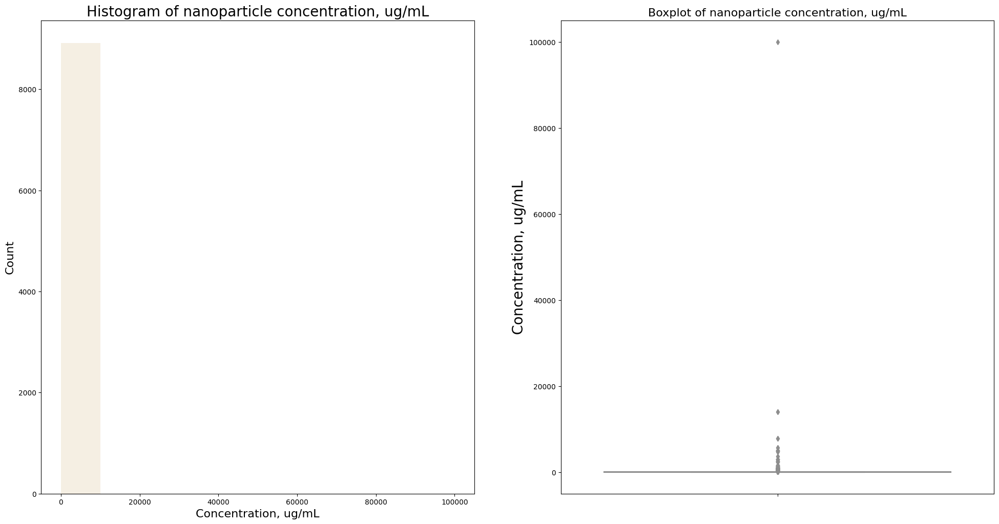

In [16]:
fig_Conc, ax_Conc = plt.subplots(nrows = 1, ncols = 2, figsize = (24, 12))
ax_Conc[0].hist(np_df['concentration_ug/mL'], color = '#F5EFE3')
ax_Conc[0].set_title('Histogram of nanoparticle concentration, ug/mL', fontsize=20)
ax_Conc[0].set_xlabel('Concentration, ug/mL', fontsize=16)
ax_Conc[0].set_ylabel('Count', fontsize=16)

ax_Conc[1]= sns.boxplot(y = np_df['concentration_ug/mL'], palette = colors)
ax_Conc[1].set_title('Boxplot of nanoparticle concentration, ug/mL', fontsize=16)
ax_Conc[1].set_ylabel('Concentration, ug/mL', fontsize=20)

plt.show()

### viability_%

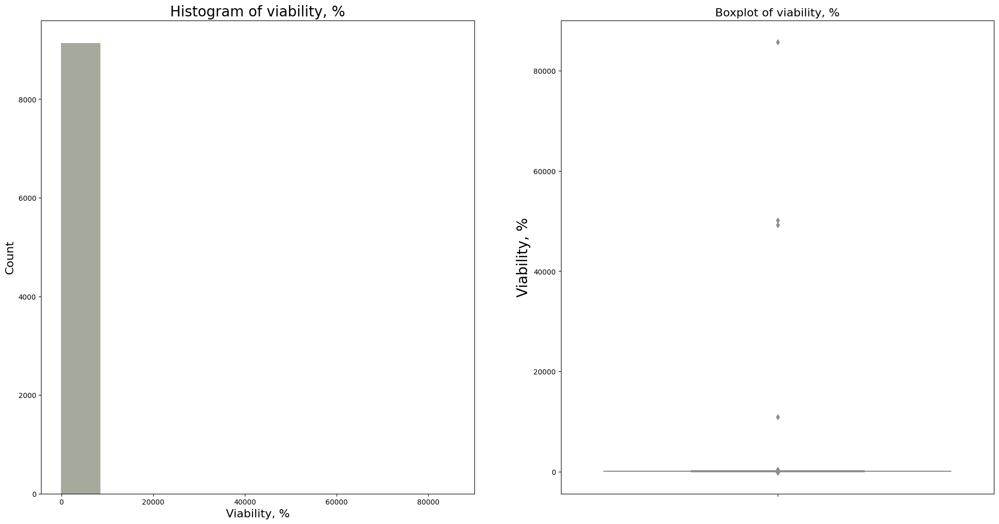

In [17]:
fig_viab, ax_viab = plt.subplots(nrows = 1, ncols = 2, figsize = (24, 12))
ax_viab[0].hist(np_df['viability_%'], color = '#A6AA9C')
ax_viab[0].set_title('Histogram of viability, %', fontsize=20)
ax_viab[0].set_xlabel('Viability, %', fontsize=16)
ax_viab[0].set_ylabel('Count', fontsize=16)

ax_viab[1]= sns.boxplot(y = np_df['viability_%'], palette = colors)
ax_viab[1].set_title('Boxplot of viability, %', fontsize=16)
ax_viab[1].set_ylabel('Viability, %', fontsize=20)

plt.show()

### time_h

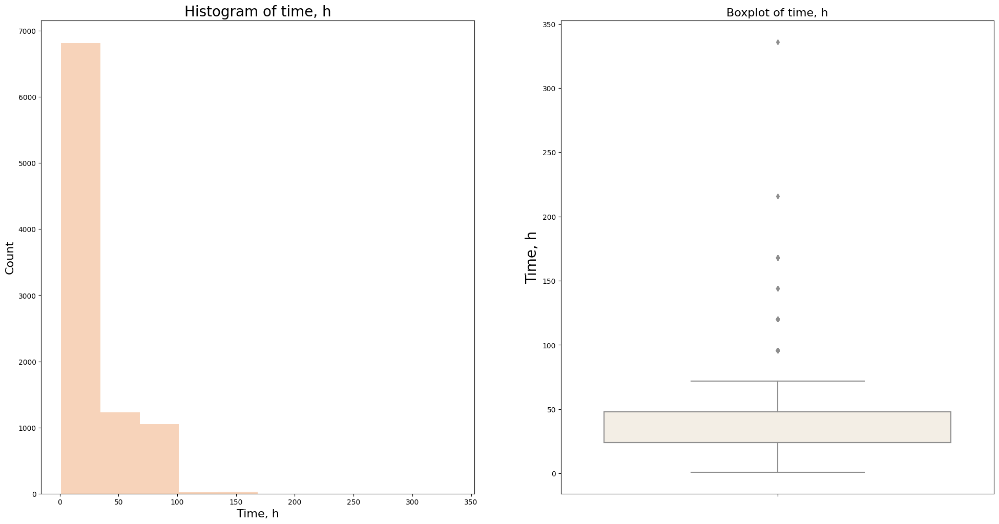

In [18]:
fig_time, ax_time = plt.subplots(nrows = 1, ncols = 2, figsize = (24, 12))
ax_time[0].hist(np_df['time_h'], color = '#F7D3BA')
ax_time[0].set_title('Histogram of time, h', fontsize=20)
ax_time[0].set_xlabel('Time, h', fontsize=16)
ax_time[0].set_ylabel('Count', fontsize=16)

ax_time[1]= sns.boxplot(y = np_df['time_h'], palette = colors)
ax_time[1].set_title('Boxplot of time, h', fontsize=16)
ax_time[1].set_ylabel('Time, h', fontsize=20)

plt.show()

### Coating

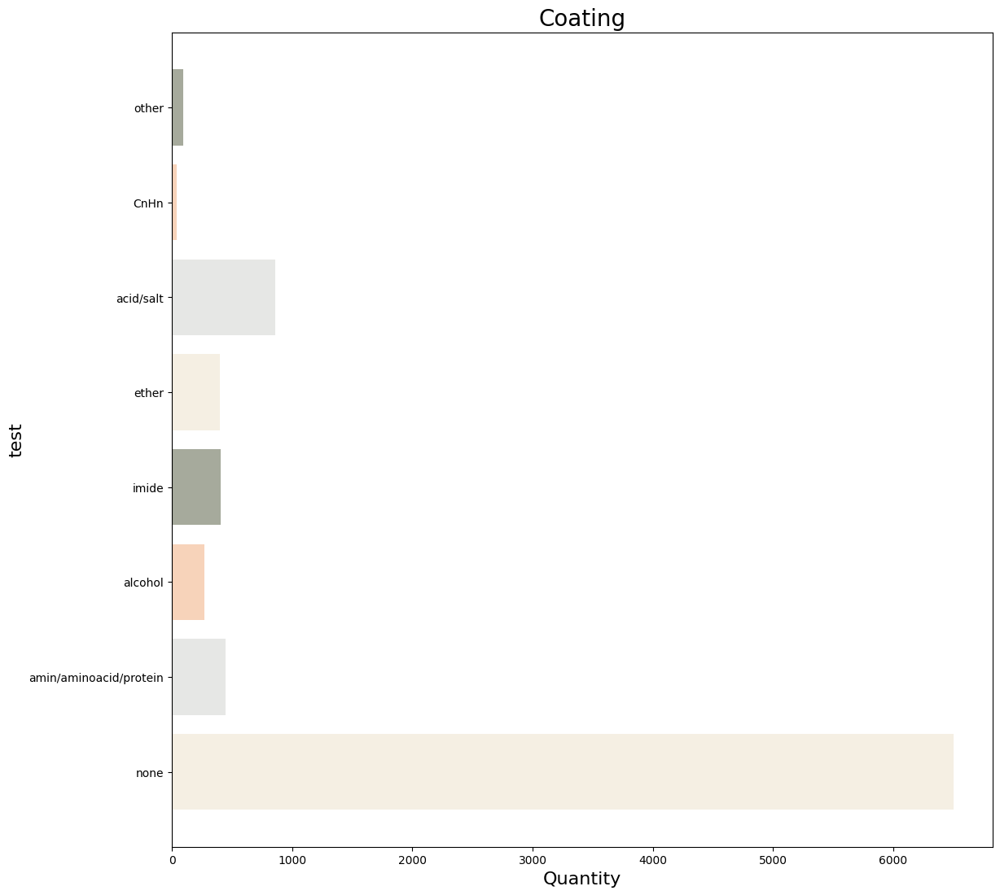

In [19]:
fig, ax = plt.subplots(figsize = (13, 13))
table = np_df.groupby('coating').count()
y_lab = ['none', 'amin/aminoacid/protein', 'alcohol', 'imide', 'ether', 'acid/salt', 'CnHn', 'other']
plt.barh(table.index, table['size_nm'], tick_label = y_lab, color = colors)
ax.set_title('Coating', fontsize=20)
ax.set_xlabel('Quantity', fontsize=16)
ax.set_ylabel('test', fontsize=16)

plt.show()

### Test

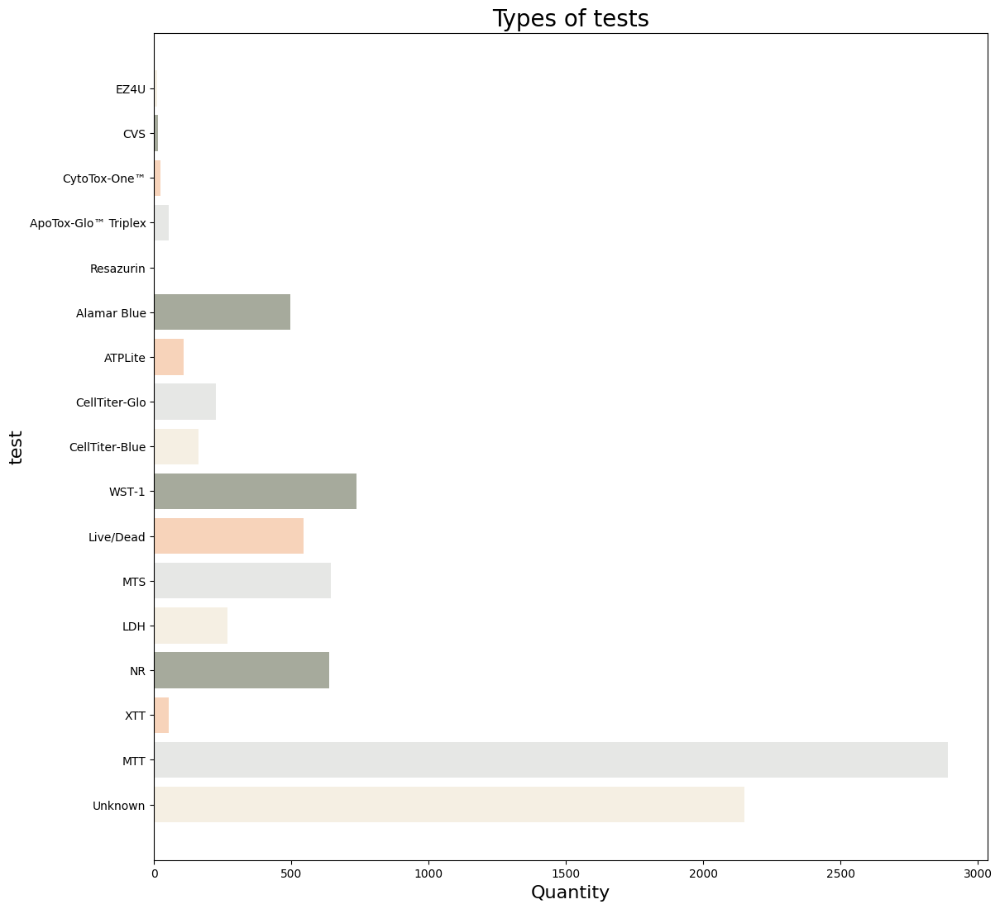

In [20]:
fig, ax = plt.subplots(figsize = (13, 13))
table = np_df.groupby('test').count()
y_lab = ['Unknown', 'MTT', 'XTT', 'NR', 'LDH', 'MTS', 'Live/Dead', 'WST­1', 'CellTiter­Blue', 'CellTiter­Glo', 'ATPLite', 'Alamar Blue', 'Resazurin', 'ApoTox­Glo™ Triplex', 'CytoTox­One™', 'CVS', 'EZ4U']
plt.barh(table.index, table['size_nm'], tick_label = y_lab, color = colors)
ax.set_title('Types of tests', fontsize=20)
ax.set_xlabel('Quantity', fontsize=16)
ax.set_ylabel('test', fontsize=16)
plt.show()

### cell_morphology

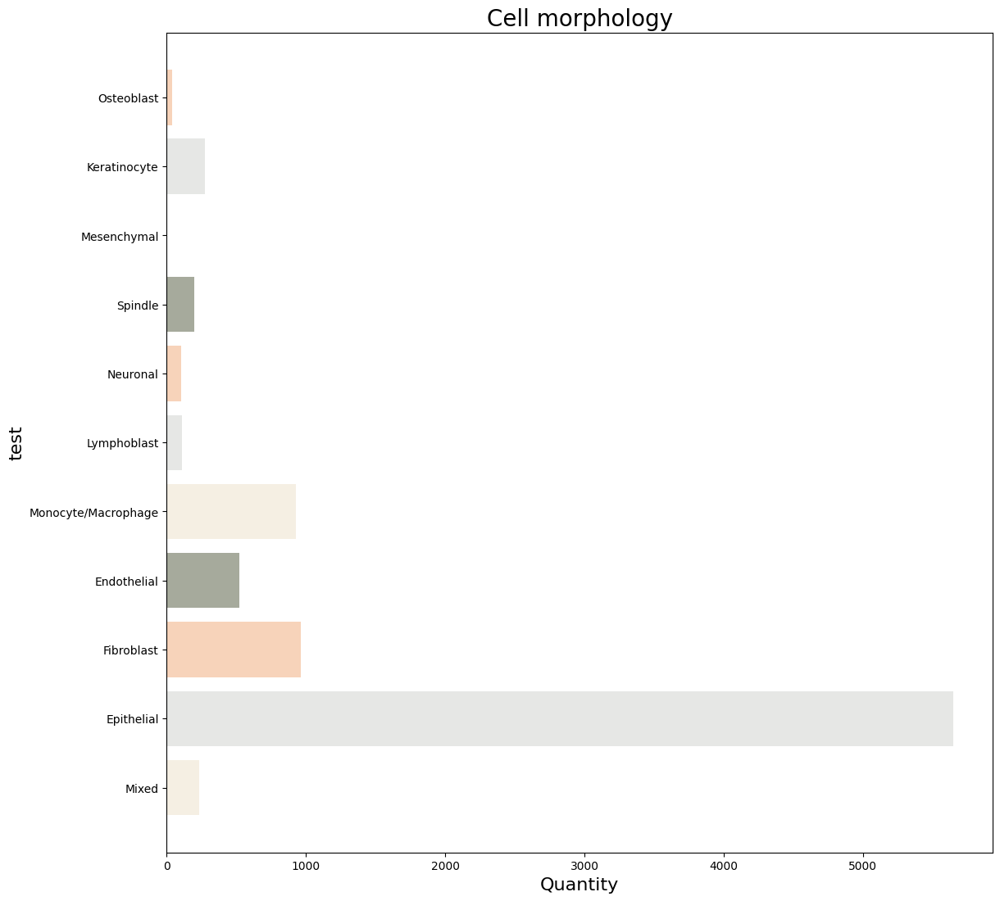

In [21]:
fig, ax = plt.subplots(figsize = (13, 13))
table = np_df.groupby('cell_morphology').count()
y_lab = ['Mixed', 'Epithelial', 'Fibroblast', 'Endothelial', 'Monocyte/Macrophage','Lymphoblast', 'Neuronal', 'Spindle', 'Mesenchymal', 'Keratinocyte', 'Osteoblast']
plt.barh(table.index, table['size_nm'], tick_label = y_lab, color = colors)
ax.set_title('Cell morphology', fontsize=20)
ax.set_xlabel('Quantity', fontsize=16)
ax.set_ylabel('test', fontsize=16)
plt.show()

### molar_mass

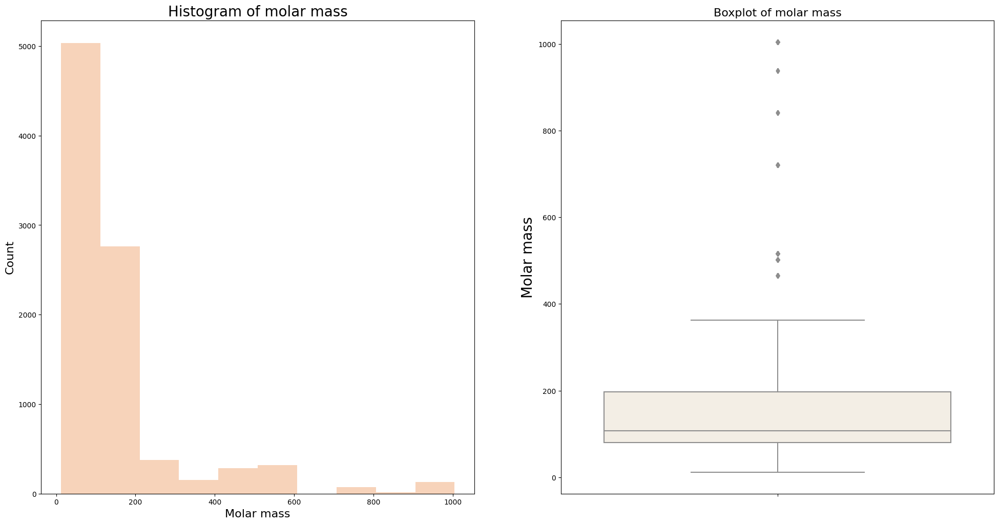

In [22]:
fig_coating, ax_coating = plt.subplots(nrows = 1, ncols = 2, figsize = (24, 12))
ax_coating[0].hist(np_df['molar_mass'], color = '#F7D3BA')
ax_coating[0].set_title('Histogram of molar mass', fontsize=20)
ax_coating[0].set_xlabel('Molar mass', fontsize=16)
ax_coating[0].set_ylabel('Count', fontsize=16)

ax_coating[1]= sns.boxplot(y = np_df['molar_mass'], palette = colors)
ax_coating[1].set_title('Boxplot of molar mass', fontsize=16)
ax_coating[1].set_ylabel('Molar mass', fontsize=20)

plt.show()

## electronegativity

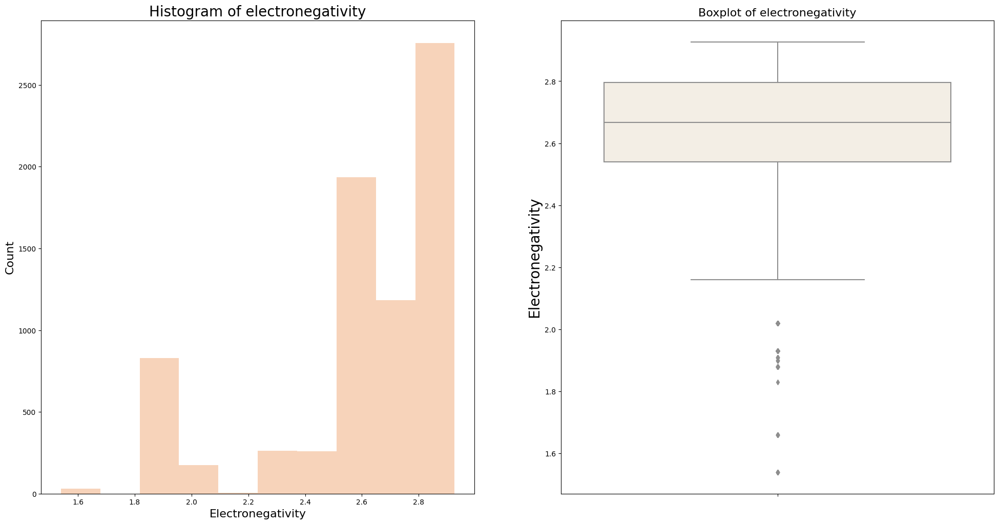

In [23]:
fig_electro, ax_electro = plt.subplots(nrows = 1, ncols = 2, figsize = (24, 12))
ax_electro[0].hist(np_df['electronegativity'], color = '#F7D3BA')
ax_electro[0].set_title('Histogram of electronegativity', fontsize=20)
ax_electro[0].set_xlabel('Electronegativity', fontsize=16)
ax_electro[0].set_ylabel('Count', fontsize=16)

ax_electro[1]= sns.boxplot(y = np_df['electronegativity'], palette = colors)
ax_electro[1].set_title('Boxplot of electronegativity', fontsize=16)
ax_electro[1].set_ylabel('Electronegativity', fontsize=20)

plt.show()

## charge_density

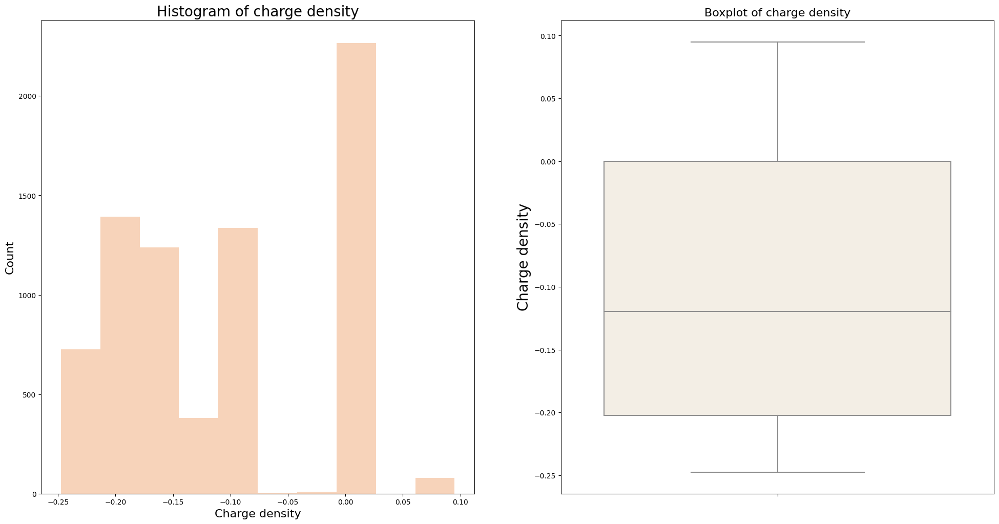

In [24]:
fig_charge, ax_charge = plt.subplots(nrows = 1, ncols = 2, figsize = (24, 12))
ax_charge[0].hist(np_df['charge_density'], color = '#F7D3BA')
ax_charge[0].set_title('Histogram of charge density', fontsize=20)
ax_charge[0].set_xlabel('Charge density', fontsize=16)
ax_charge[0].set_ylabel('Count', fontsize=16)

ax_charge[1]= sns.boxplot(y = np_df['charge_density'], palette = colors)
ax_charge[1].set_title('Boxplot of charge density', fontsize=16)
ax_charge[1].set_ylabel('Charge density', fontsize=20)

plt.show()

## Выбросы

In [25]:
#Уберем выбросы для колонки Size_nm
q = np_df['size_nm'].quantile(0.99)
np_df.loc[np_df['size_nm'] > q, 'size_nm'] = np.nan


#Уберем выбросы для surface_charge_mV
q = np_df['surface_charge_mV'].quantile(0.99)
np_df.loc[np_df['surface_charge_mV'] > q, 'surface_charge_mV'] = np.nan
np_df.loc[np_df['surface_charge_mV'] < -q, 'surface_charge_mV'] = np.nan

#Уберем выбросы для concentration_ug/mL
q = np_df['concentration_ug/mL'].quantile(0.99)
np_df.loc[np_df['concentration_ug/mL'] > q, 'concentration_ug/mL'] = np.nan

#Уберем выбросы для viability_%
np_df.loc[np_df['viability_%'] > 120, 'viability_%'] = np.nan 
np_df.loc[np_df['viability_%'] < 0, 'viability_%'] = np.nan

#Уберем выбросы для time_h
q = np_df['time_h'].quantile(0.99)
np_df.loc[np_df['time_h'] > q, 'time_h'] = np.nan

#Уберем выбросы для electronegativity
q = np_df['electronegativity'].quantile(0.99)
np_df.loc[np_df['electronegativity'] > q, 'electronegativity'] = np.nan

In [26]:
#используем метод kNN для заполнения недостающих данных
db = np_df.loc[:,'size_nm':]
imputer = KNNImputer(n_neighbors=5)  #введем функцию для метода kNN с использованием для предсказания 5 ближайших соседей
db_filled = imputer.fit_transform(db) #записываем в новую переменную заполненную базу данных
impute_data = pd.DataFrame(imputer.fit_transform(db_filled), columns=db.columns)
db = impute_data
db.insert(0, 'nanoparticle', np_df.nanoparticle)

In [27]:
np_df = db
np_df.to_excel('final_db_np.xlsx')

# Корреляции и тепловые диаграммы

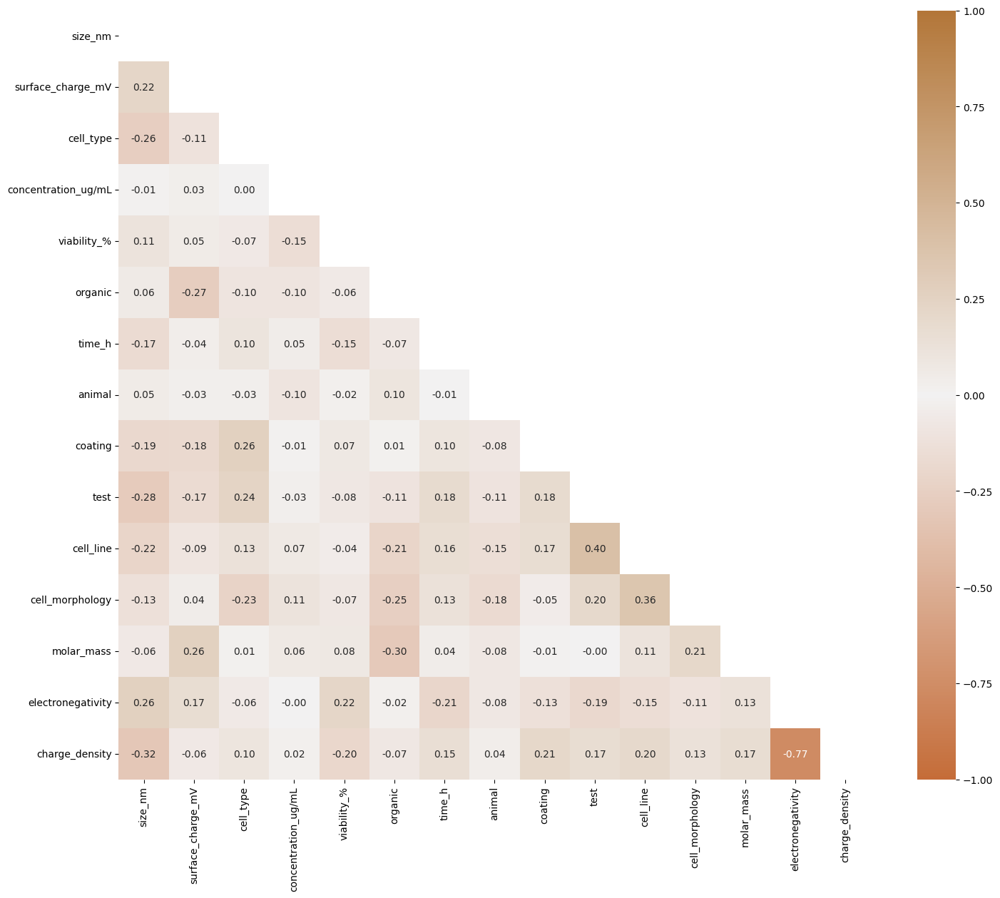

In [28]:
mask = np.triu(np.ones_like(np_df.corr(), dtype=bool)) #создаем маску для выделения верхнего треугольника массива
cmap = sns.diverging_palette(30, 42, s=80, l=55, n=9, as_cmap=True) #создание палитры для корреляционного графика
plt.figure(figsize=(17, 14)) #создание графика и определение его размеров
plot = sns.heatmap(np_df.corr(), annot=True, fmt=".2f", mask=mask, vmin=-1, vmax=1, center= 0, cmap=cmap, linewidth=0.0005) 
#annot=True - вывод коэффициентов корреляции, fmt - число знаков после запятой, v - пределы, cmap - палитра, linewidth - толщина шрифта

## Вывод
Viability не коррелирует почти ни с чем, если также посмотреть на ProfileReport, то можно выделить size_nm, molar_mass, coating, surface_charge_mV, electronegativity, charge density

In [29]:
np_df_mini = np_df[['size_nm', 'surface_charge_mV', 'viability_%', 'organic','molar_mass', 'electronegativity', 'charge_density']]
np_df_mini

,size_nm,surface_charge_mV,viability_%,organic,molar_mass,electronegativity,charge_density
0,313.8,7.6,9.10,1.0,79.54540,2.670000,-0.110000
1,114.7,28.8,9.50,1.0,81.40840,2.545000,-0.095000
2,114.7,28.8,10.20,1.0,81.40840,2.545000,-0.095000
3,69.4,28.8,11.00,1.0,81.40840,2.545000,-0.095000
4,291.7,-46.1,11.30,1.0,157.87429,2.684000,-0.206944
...,...,...,...,...,...,...,...
9138,113.0,56.0,100.00,0.0,104.10000,1.930000,0.000000
9139,113.0,56.0,114.57,0.0,104.10000,1.930000,0.000000
9140,113.0,56.0,119.65,0.0,104.10000,1.930000,0.000000
9141,113.0,56.0,117.22,0.0,104.10000,1.930000,0.000000


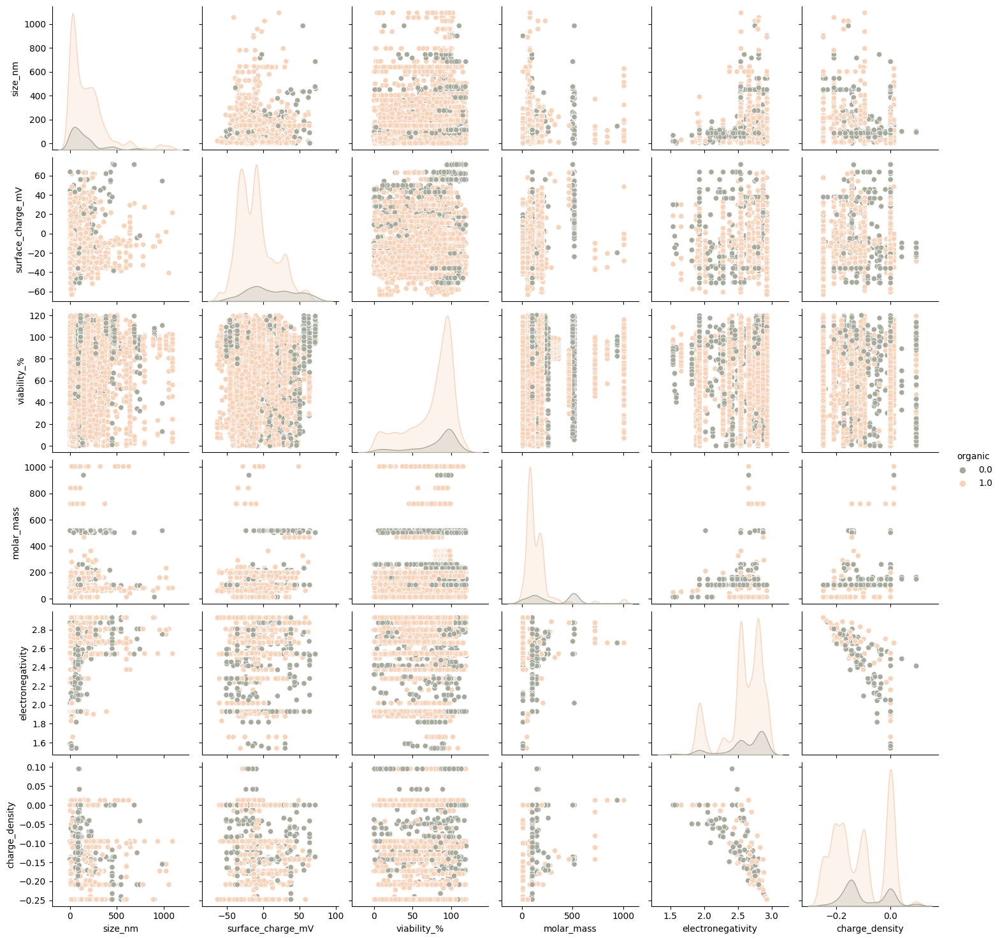

In [30]:
sns.pairplot(np_df_mini, hue = 'organic', palette = ['#A6AA9C', '#F7D3BA'])

## Скрипичные диаграммы (Violin plot)

In [31]:
organic = {0 : 'Organic', 1 : 'Inorganic'}
cell_type = {0 : 'Non cancer', 1 : 'Cancer'}
coat = {0: 'none', 1: 'amin/aminoacid/protein', 2: 'alcohol', 3: 'imide', 4: 'ether', 5: 'acid/salt', 6: 'CnHn', 7: 'other'}
 
np_df['organic'].replace(organic, inplace = True)
np_df['cell_type'].replace(cell_type, inplace = True)
np_df['coating'].replace(coat, inplace = True)

C:\Users\I\AppData\Local\Temp\ipykernel_22392\3767368322.py:6: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[5, 0].set_xticklabels(g.axes[5, 0].get_xticks(), rotation = 90)
C:\Users\I\AppData\Local\Temp\ipykernel_22392\3767368322.py:7: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[5, 1].set_xticklabels(g.axes[5, 1].get_xticks(), rotation = 90)
C:\Users\I\AppData\Local\Temp\ipykernel_22392\3767368322.py:8: UserWarning: FixedFormatter should only be used together with FixedLocator
  g.axes[5, 2].set_xticklabels(g.axes[5, 2].get_xticks(), rotation = 90)


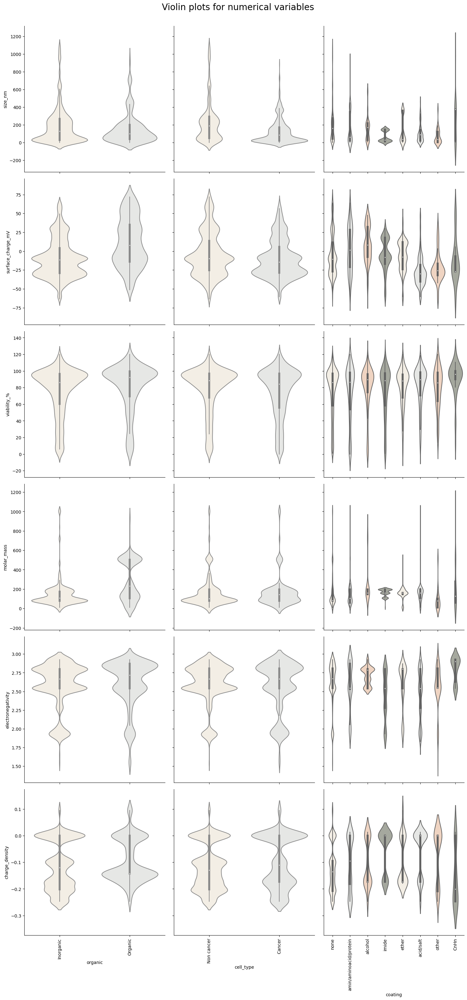

In [32]:
g = sns.PairGrid(data=np_df,
                 x_vars=['organic', 'cell_type', 'coating'],
                 y_vars=['size_nm', 'surface_charge_mV', 'viability_%','molar_mass', 'electronegativity', 'charge_density'],
                 height=5, palette = colors, )
g.fig.suptitle('Violin plots for numerical variables', y = 1.01, fontsize = 20)
g.axes[5, 0].set_xticklabels(g.axes[5, 0].get_xticks(), rotation = 90)
g.axes[5, 1].set_xticklabels(g.axes[5, 1].get_xticks(), rotation = 90)
g.axes[5, 2].set_xticklabels(g.axes[5, 2].get_xticks(), rotation = 90)
g.map(sns.violinplot)
plt.show()